In [1]:
import pandas as pd
import numpy as np
import warnings


In [2]:
import pandas as pd
import glob
import os


files = os.path.join("DissData", "midas*.csv" )
files = glob.glob(files) # files is a list of names of files in the directory

for count, f in enumerate(files): # for each file
    df = pd.read_csv(f, skiprows=90)
    df1 = df[['ob_end_time', 'max_air_temp', 'min_air_temp']]
    df1.drop(df1.tail(1).index,inplace=True) # drop last n rows
    df1 = df1.rename(columns={"ob_end_time": "Time", "max_air_temp": "Max Air Temp", "min_air_temp": "Min Air Temp"})
    df1['Average'] = df1.mean(axis=1)
    ndf = df1[df1['Time'].str.contains("09:00:00")]
    new_keys = ndf['Time'].str.rstrip('09:00:00')
    df1['Time'] = new_keys
    name = "DissData/cleaned/"+"data" + str(count) + ".csv"
    df1.to_csv(name, index=False)
#print(files)
warnings.filterwarnings(action='once')

C:\Users\Eric\AppData\Local\Temp\ipykernel_10260\2986375301.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1.drop(df1.tail(1).index,inplace=True) # drop last n rows
C:\Users\Eric\AppData\Local\Temp\ipykernel_10260\2986375301.py:14: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df1['Average'] = df1.mean(axis=1)
C:\Users\Eric\AppData\Local\Temp\ipykernel_10260\2986375301.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1.drop(df1.tail(1).in

C:\Users\Eric\AppData\Local\Temp\ipykernel_10260\2986375301.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1.drop(df1.tail(1).index,inplace=True) # drop last n rows
C:\Users\Eric\AppData\Local\Temp\ipykernel_10260\2986375301.py:14: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  df1['Average'] = df1.mean(axis=1)


In [3]:
joined_files = os.path.join("DissData/cleaned/", "data*.csv")

# A list of all joined files is returned
joined_list = glob.glob(joined_files)
  
# Finally, the files are joined
df = pd.concat(map(pd.read_csv, joined_list), ignore_index=True)
df.to_csv("testConcat.csv", index=False)

In [4]:
joindf = df
#df = df.apply (pd.to_numeric, errors='coerce')
df = df.dropna()
df

,Time,Max Air Temp,Min Air Temp,Average
0,1999-01-01,7.6,6.8,7.20
2,1999-01-02,7.6,6.9,7.25
4,1999-01-03,7.1,4.9,6.00
6,1999-01-04,5.8,3.1,4.45
8,1999-01-05,6.4,4.0,5.20
...,...,...,...,...
13106,2008-12-27,3.9,-1.6,1.15
13108,2008-12-28,5.3,4.7,5.00
13110,2008-12-29,6.0,4.7,5.35
13112,2008-12-30,1.9,-1.9,0.00


In [5]:
from prophet import Prophet

In [6]:
edf = joindf.drop([ 'Average', 'Min Air Temp'], axis=1)
edf = edf.rename(columns={"Time": "ds", "Max Air Temp": "y"})
edf = edf.dropna()
edf.drop_duplicates(keep=False, inplace=True)
edf.head()

,ds,y
0,1999-01-01,7.6
2,1999-01-02,7.6
4,1999-01-03,7.1
6,1999-01-04,5.8
8,1999-01-05,6.4


In [7]:
m = Prophet()
m.fit(edf)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
INFO:cmdstanpy:start chain 1
INFO:cmdstanpy:finish chain 1


In [8]:
future = m.make_future_dataframe(periods=18250)
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
24817,2067-12-15,9.578874,-0.403046,20.040909
24818,2067-12-16,9.444390,-0.553208,19.901937
24819,2067-12-17,9.284625,-0.791095,19.805530
24820,2067-12-18,9.341342,-0.529938,19.677663
24821,2067-12-19,9.264677,-1.108336,19.451594


In [18]:
odf = forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
#odf.to_csv("testConcat.csv",header=False, index=False)
hdf = forecast[['ds','yhat_upper']]

In [20]:
hdf['ds'] = pd.to_datetime(hdf['ds'], format='%Y-%m-%d')

C:\Users\Eric\AppData\Local\Temp\ipykernel_10260\1308066985.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [25]:
fildf = hdf.loc[(hdf['ds'] >= '2023-01-01')]
#fildf

In [31]:
netdf = fildf[['yhat_upper']]
netdf.to_csv("netLogoInput.csv",header=False, index=False)

Text(89.34722222222221, 0.5, 'Temperature (C)')

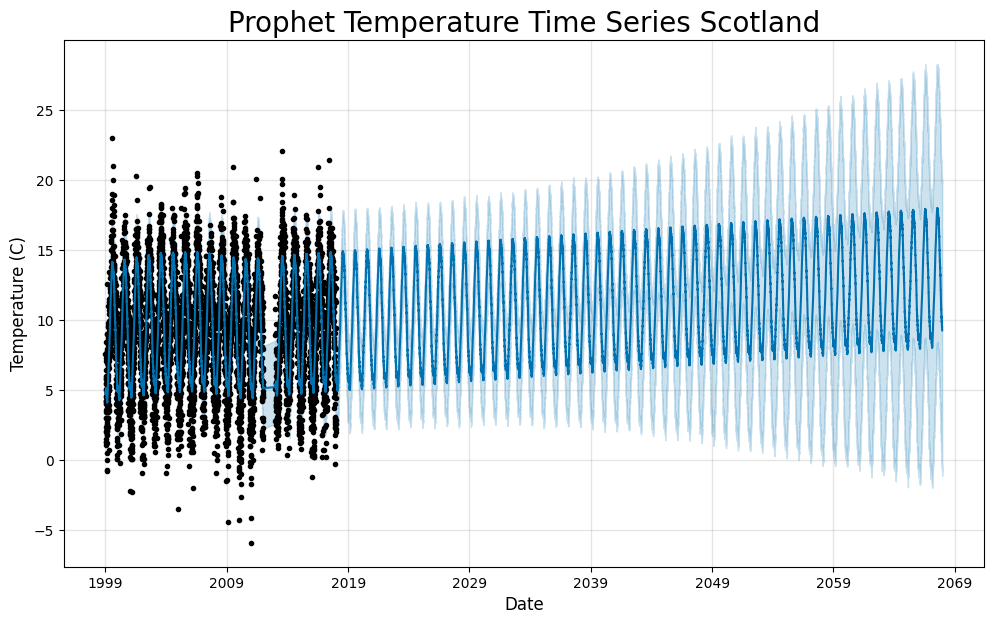

In [37]:
fig1 = m.plot(forecast)
ax = fig1.gca()
ax.set_title("Prophet Temperature Time Series Scotland", size=20)
ax.set_xlabel("Date", size=12)
ax.set_ylabel("Temperature (C)", size=12)

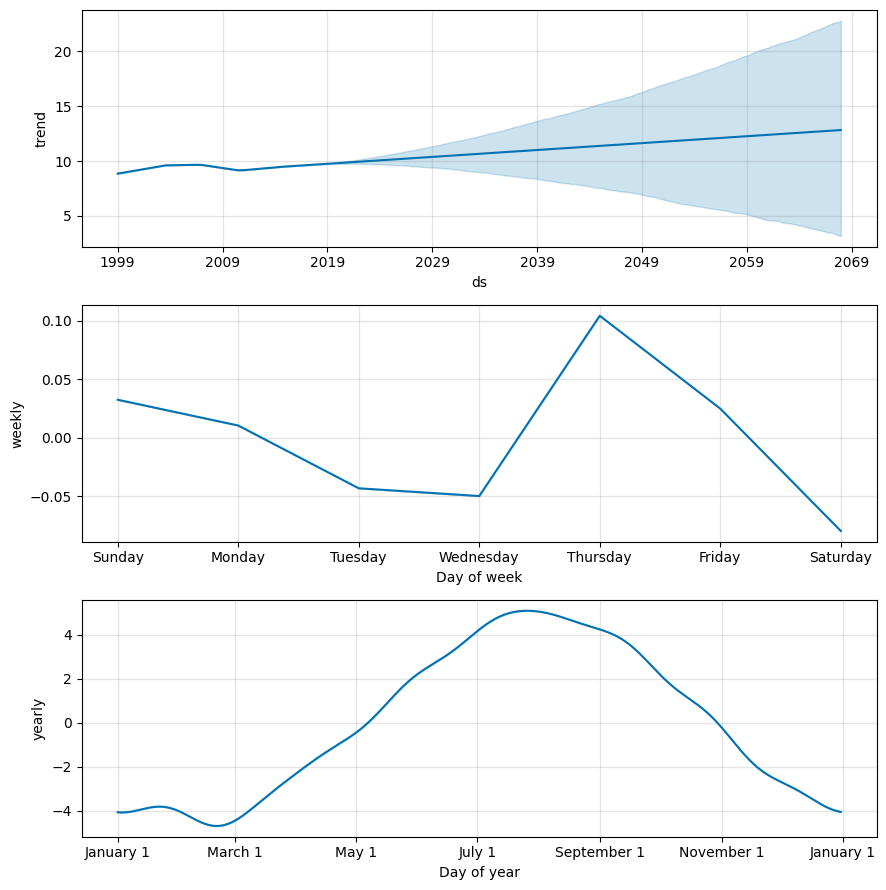

In [10]:
fig2 = m.plot_components(forecast)


In [11]:
from prophet.plot import plot_plotly, plot_components_plotly

plot_plotly(m, forecast)

In [12]:
plot_components_plotly(m, forecast)


C:\Users\Eric\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.8_qbz5n2kfra8p0\LocalCache\local-packages\Python38\site-packages\plotly\basedatatypes.py:2305: DeprecationWarning:

The append_trace method is deprecated and will be removed in a future version.
Please use the add_trace method with the row and col parameters.


